In [85]:
from vaivision import dream

In [1]:
from keras.applications import VGG16
from keras import backend as K
import numpy as np
from vaiutils import plot_images, merge, path_consts
from tqdm import tqdm_notebook
from scipy.misc import imresize
from keras.backend import set_learning_phase

Using TensorFlow backend.


In [2]:
for k,v in path_consts('FilterVis', 'FilterVis'):
    exec(k+'=v')

In [37]:
model = VGG16(include_top=False)

58818560/58889256 [============================>.] - ETA: 0s

In [38]:
model.summary()
model

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0         
__________

In [5]:
from vaiutils import plot_image

In [79]:
def dream(images=None, layer_num=4, filter_index=None):
    input_img = model.input

    layer_output = model.layers[layer_num].output
    if filter_index is None:
        loss = K.mean(layer_output)
    else:
        loss = K.mean(layer_output[:, :, :, filter_index])

    grads = K.gradients(loss, input_img)[0]
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-10)

    iterate = K.function([input_img], [loss, grads])
    
    if images is None:
        images = np.random.random((1, 224, 224, 3)) * 20 + 128
        batched = False
    elif len(images.shape) == 3:
        images = np.stack([images])
        batched = False
    else:
        batched = True

    for _ in tqdm_notebook(range(20)):
        loss_value, grads_value = iterate([images])
        images += grads_value * 1
        #print(loss_value, grads_value.mean(), grads_value.max())
        
    def deprocess_image(x):
        x -= x.mean()
        x /= (x.std() + 1e-5)
        x *= 0.1

        x+= 0.5
        x = np.clip(x, 0, 1)

        x*= 255
        x = np.clip(x, 0, 255).astype('uint8')
        return x
    
    if batched:
        return deprocess_image(images)
    else:
        return deprocess_image(images)[0]

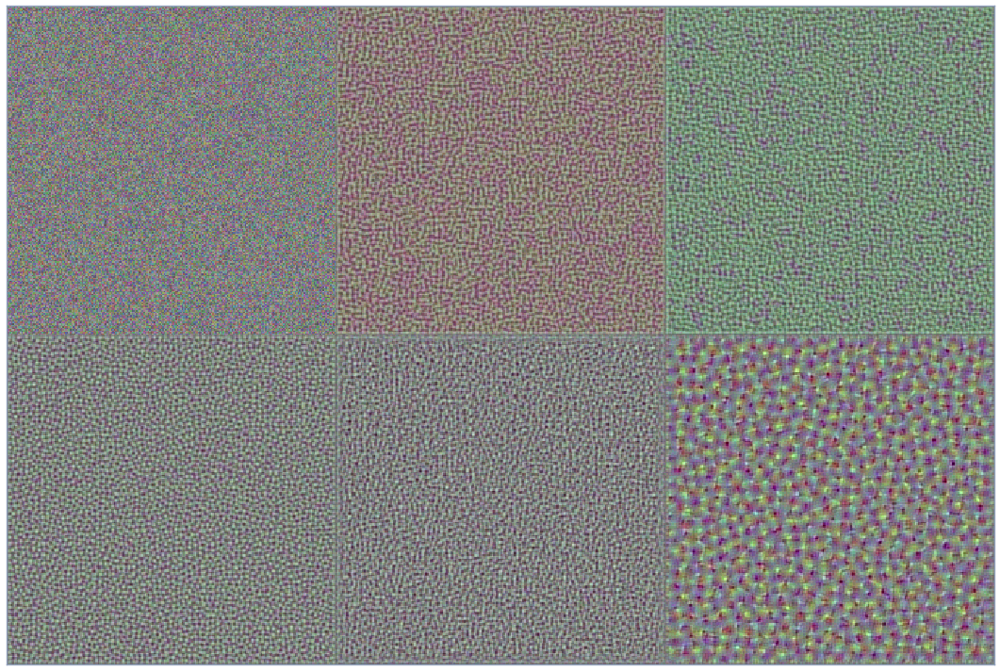

In [84]:
plot_images(merge(np.stack([dream(layer_num=i)  for i in range(0, 6)])), pixel_range=(0,255))

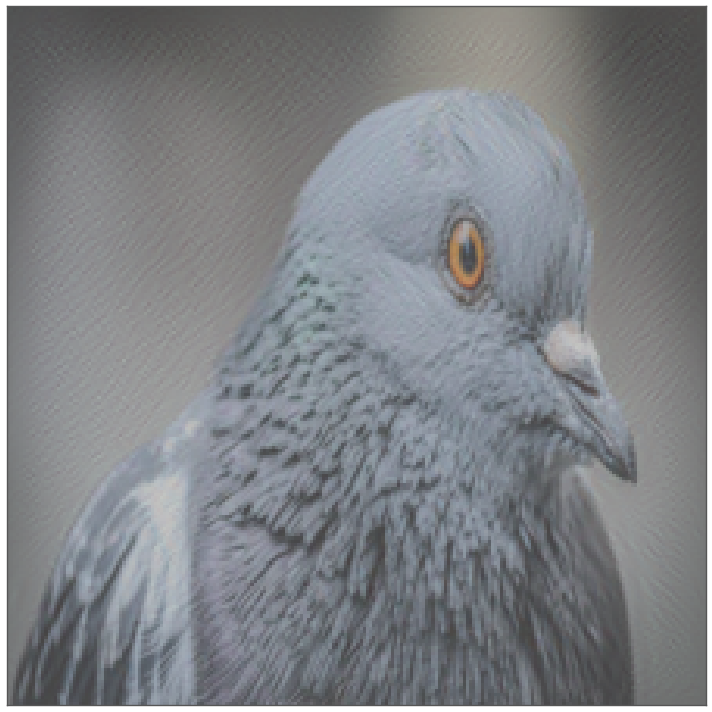

In [119]:
plot_images(merge(np.stack([dream(image, layer_num=randint(2, 49), filter_index=None)])).astype('uint8'))

In [108]:
image = imresize(imread(DIR_DATA+'/pigeon.jpg'), (224, 224)).astype('float32')

In [66]:
plot_images(merge(dream(np.stack([np.random.random((224, 224, 3)) * 20 + 128, image]), layer_id=2, filter_index=None)).astype('uint8'))

TypeError: dream() got an unexpected keyword argument 'layer_id'

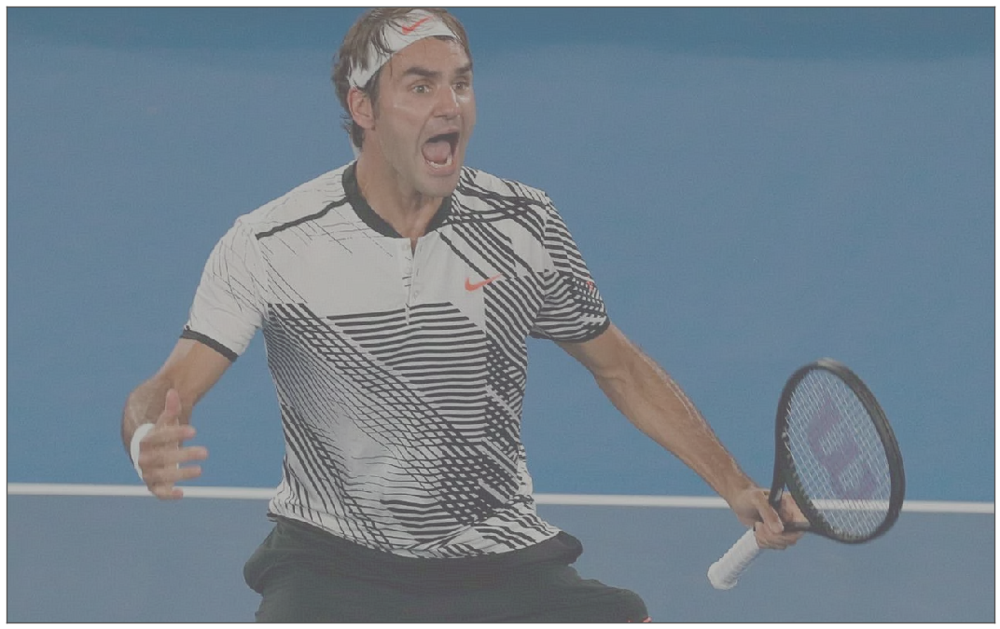

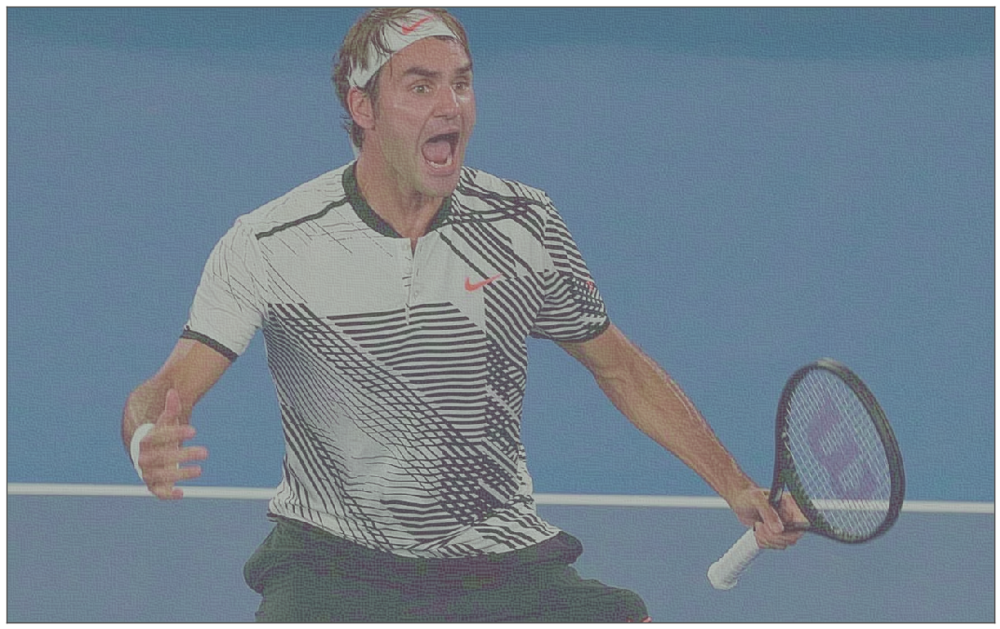

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


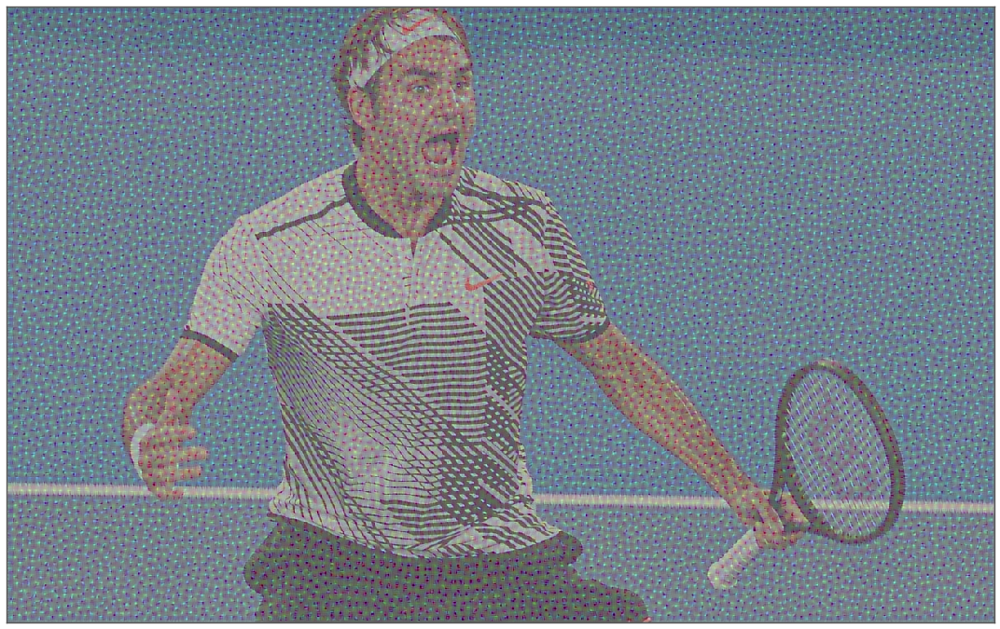

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


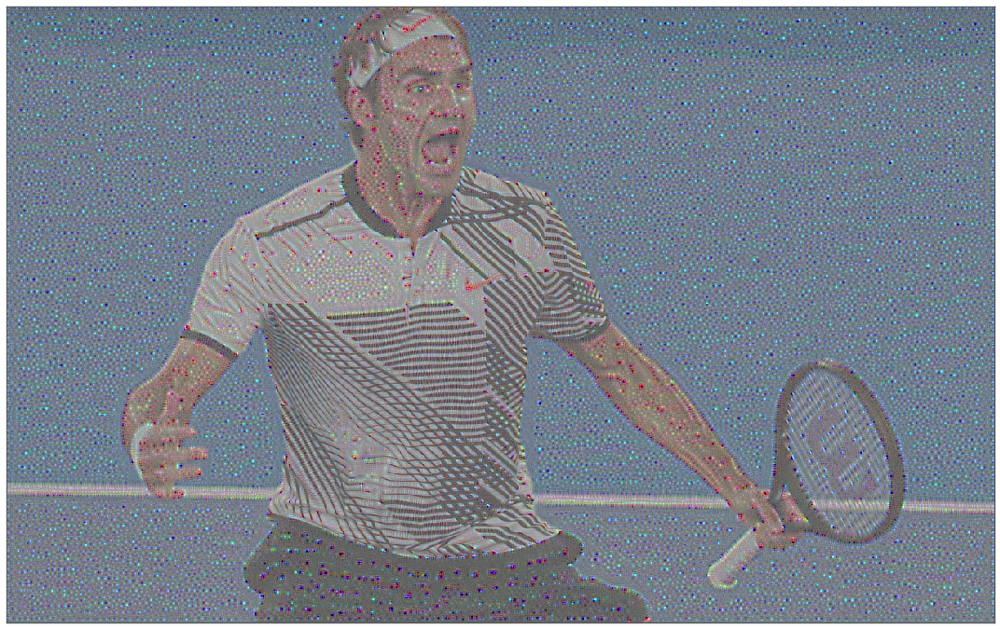

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


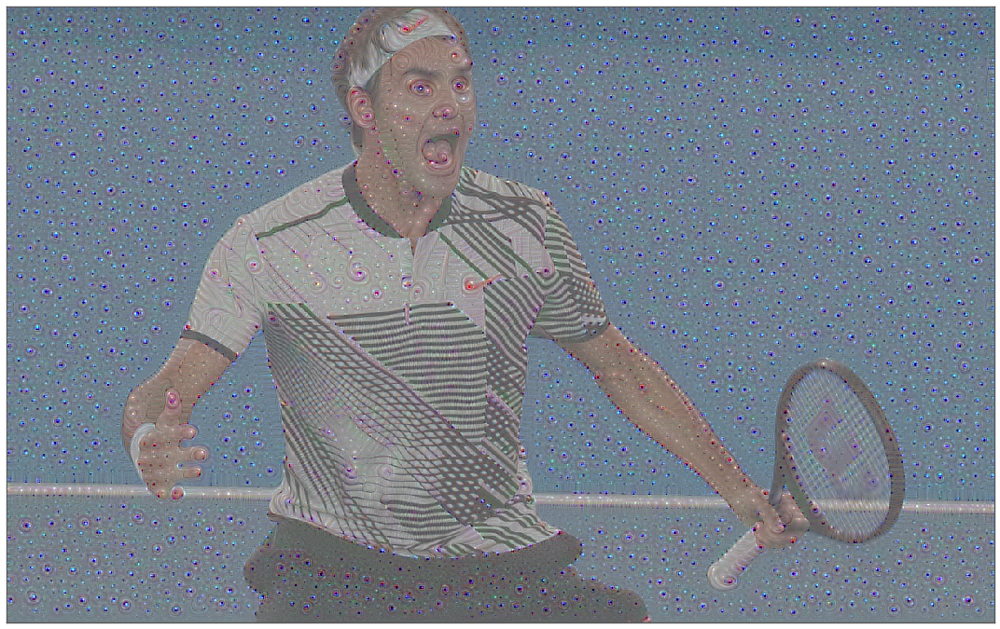

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


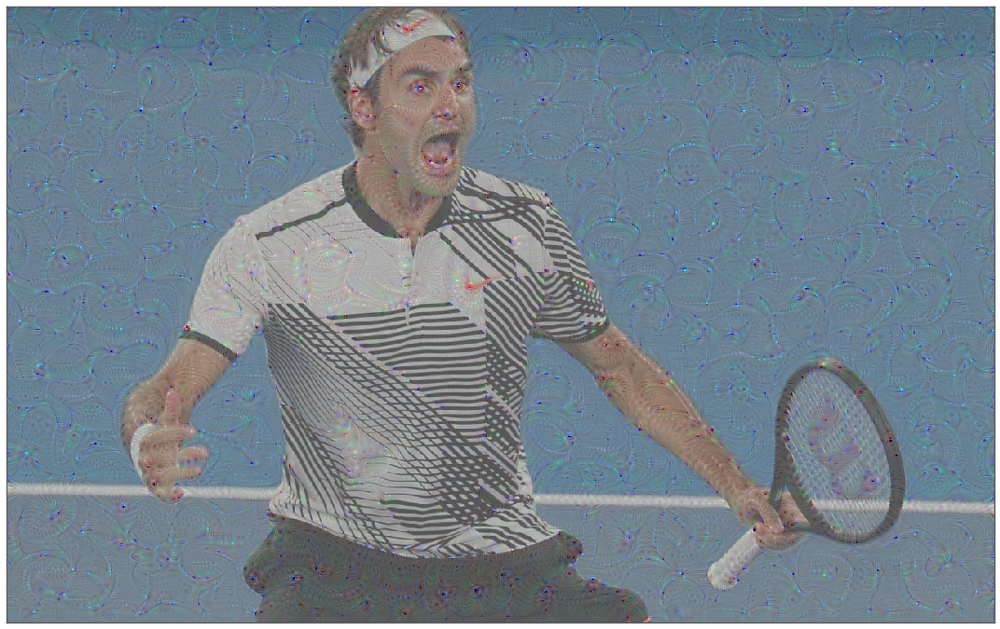

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


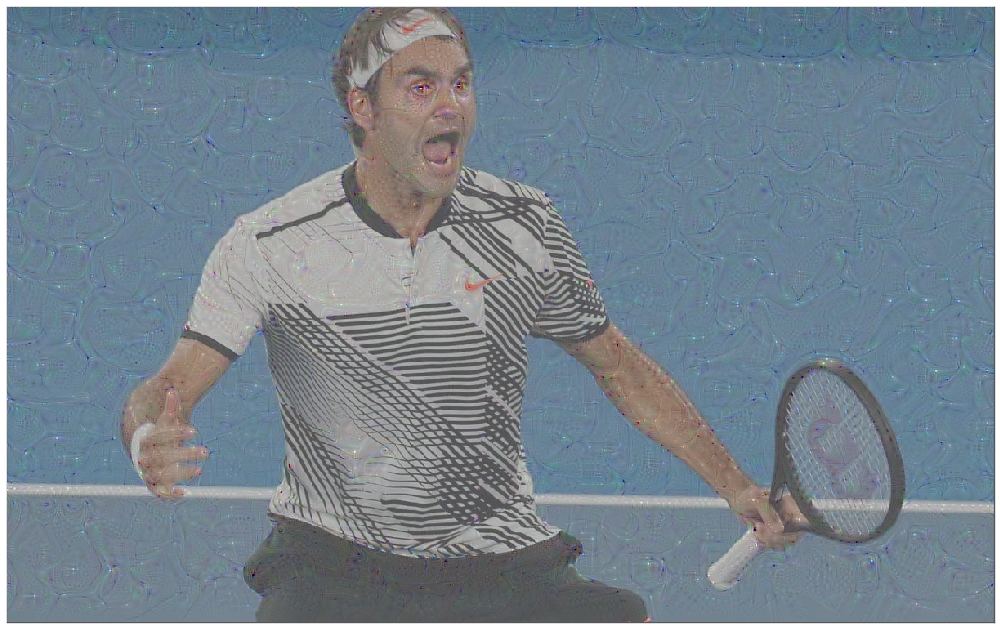

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [10]:
from time import sleep
#plot_images(np.stack([image]).astype('uint8'))
for dreamed_image in dreamed_images:
    plot_images(np.stack([dreamed_image]))
    sleep(1)

0.269233 -7.33028e-06
0.360806 -6.85177e-05
0.508496 0.00040894
0.809492 0.000752671
1.19958 0.00150092
1.6899 0.00206612
2.3199 0.00277895
3.01371 0.00322538
3.64056 0.00411666
4.48849 0.00458571
4.9286 0.00438748
5.81969 0.00568784
6.28563 0.00532171
7.89868 0.00763899
8.67162 0.00620401
9.71146 0.00874789
10.4272 0.00686851
11.7551 0.0100923
12.8463 0.00793269
14.0072 0.011221



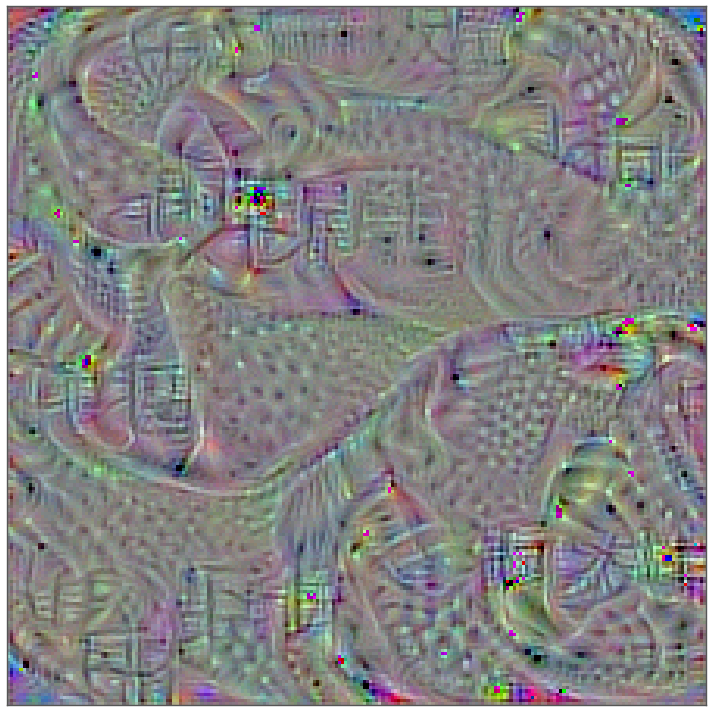

In [35]:
plot_images(merge(np.stack([dream(layer_id = 2, filter_index=None)])))